In [1]:
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import plotly.offline as pyo
from sklearn.model_selection import train_test_split
import xgboost as xgb

from eda_tools.graphs.discrete_feature_binary_target import bar, bar_numerical
from eda_tools.graphs.continuous_feature_binary_target import histogram, probability_density_function
from eda_tools.graphs.two_discrete_features_binary_target import marimekko, barchart_100_percent
from eda_tools.probability_distribution import ProbabilityDistribution

pyo.init_notebook_mode()

# Load data

In [2]:
df = pd.read_csv("term-deposit-marketing-2020.csv")

In [3]:
df.shape

(40000, 14)

In [4]:
df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,no


For convenience, we will convert the target variable to boolean type. First let's check that there are only two values:

In [5]:
df.y.unique()

array(['no', 'yes'], dtype=object)

In [3]:
df.y = df.y == "yes"

In [9]:
df.y.mean()

0.0724

# Feature explorations

## Age

There are no null values

In [10]:
pd.isnull(X.age).any()

False

Now we see in the age distribution that most people are between 25 and 60 years. Then, there is a sudden drop, probably because the bank considers that people with more than 60 years are not interested in the product.

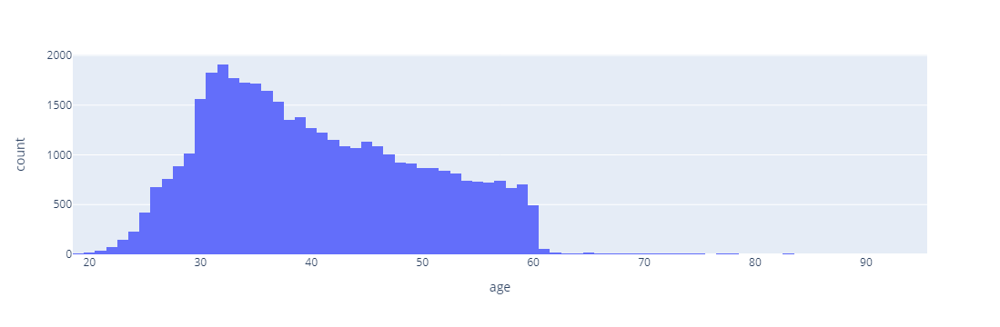

In [11]:
px.histogram(X, x="age")

We can see the relation between this variable and the target in the next graph:

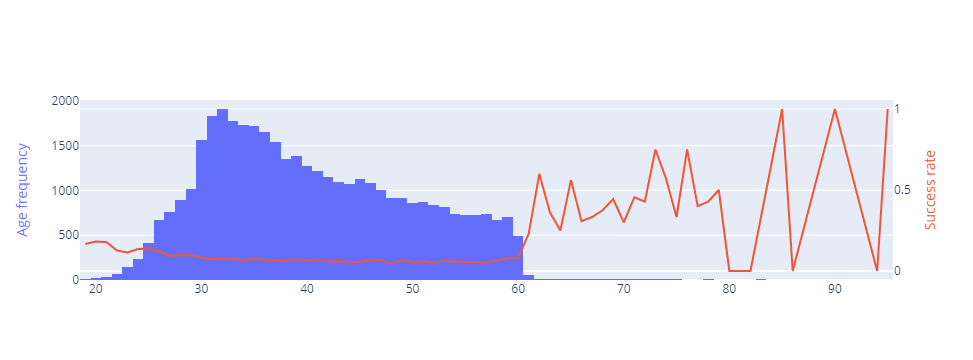

In [12]:
success_rate = df.groupby(by="age")["y"].mean()

go.Figure(
    data=[
        go.Histogram(x=df.age, yaxis="y", showlegend=False),
        go.Scatter(x=success_rate.index, y=success_rate, yaxis="y2", showlegend=False),
    ],
    layout=go.Layout(
        yaxis=dict(
            title="Age frequency",
            titlefont=dict(
                color=px.colors.qualitative.Plotly[0]
            ),
            side="left"
        ),
        yaxis2=dict(
            title="Success rate",
            anchor="x",
            overlaying="y",
            side="right",
            titlefont=dict(
                color=px.colors.qualitative.Plotly[1]
            ),
        ),
    )
)


We should not pay much attention to the success rate from 60 years onwards, since the amount of people in that range is actually very low and there will be of course a lot of noise. Maybe a better way of visualizing this without the noise is to discretize the samples in groups with the same number of people, this is, what remains constant is the quantiles, not the age interval:

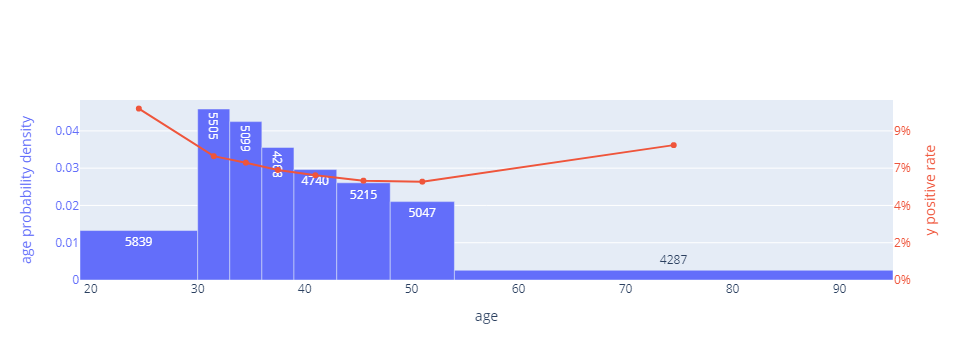

In [13]:
histogram(df, "age", "y", keep_group_size_constant=True)

## Job

There are not null values:

In [14]:
df.job.unique()

array(['management', 'technician', 'entrepreneur', 'blue-collar',
       'unknown', 'retired', 'admin', 'services', 'self-employed',
       'unemployed', 'housemaid', 'student'], dtype=object)

When we represent the amount of people in each category and the success rate among them we see this:

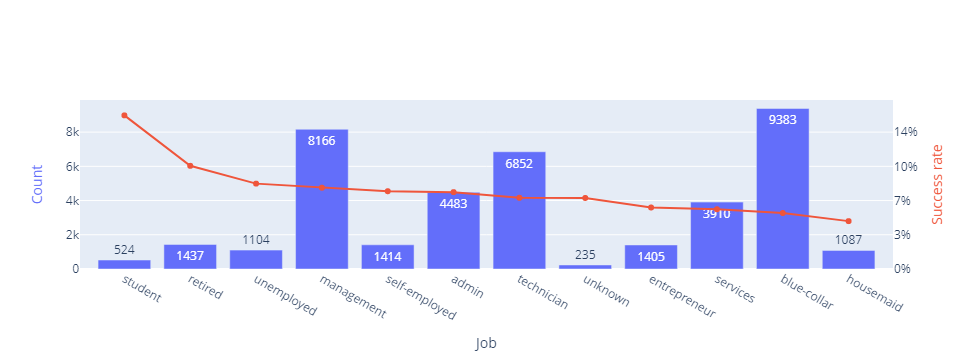

In [15]:
bar(df.job, df.y, feature_name="Job", target_average_name="Success rate")

We can see there are two really interesting categories: retired and student. Bot have higher success rates than the rest. This goes in consonance with what we indeed saw in previous graph by age, where they were the young and the old the ones with a higher success rate. We can represent both together:

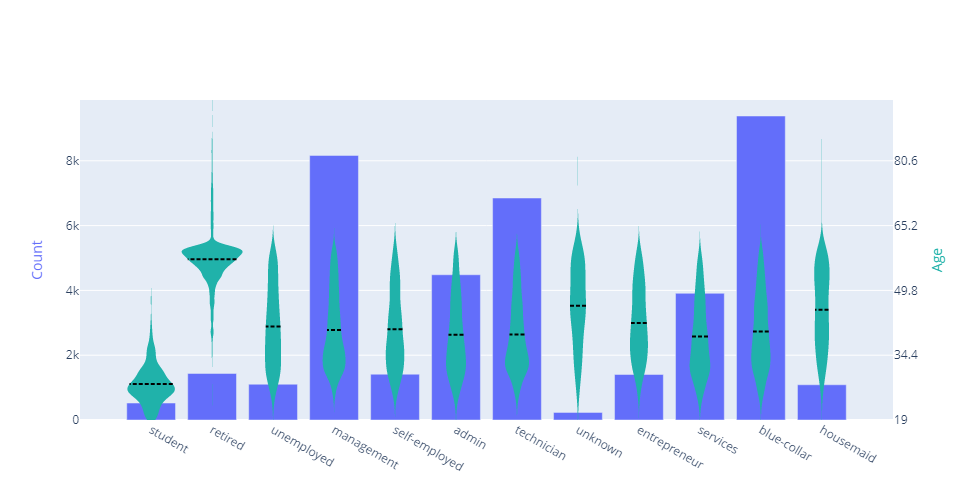

In [16]:
df_grouped = df.groupby(by=["job"]).aggregate(
    freq=pd.NamedAgg("y", "count"),
    success_rate=pd.NamedAgg("y", "mean")
).reset_index().sort_values("success_rate", ascending=False)

job_order = df_grouped.job

go.Figure(
    data=[
        go.Bar(
            x=df_grouped.job,
            y=df_grouped.freq,
            name="Count",
            yaxis="y",
            showlegend=False,
        ),
        go.Violin(
            x=df_train.job,
            y=df_train.age,
            width=1,
            fillcolor='lightseagreen',
            line_width=0,
            meanline = dict(color="black", width=2),
            points=False,
            showlegend=False,
            yaxis="y2",
        )
    ],
    layout=go.Layout(
        yaxis=dict(
            title="Count",
            titlefont=dict(
                color=px.colors.qualitative.Plotly[0]
            ),
            side="left"
        ),
        yaxis2=dict(
            title="Age",
            anchor="x",
            overlaying="y",
            side="right",
            titlefont_color="lightseagreen",
            tickmode="sync",
            range=[df_train.age.min(), df_train.age.max()]
        ),
        height=500
    )
)

## Marital

In [17]:
df.marital.unique()

array(['married', 'single', 'divorced'], dtype=object)

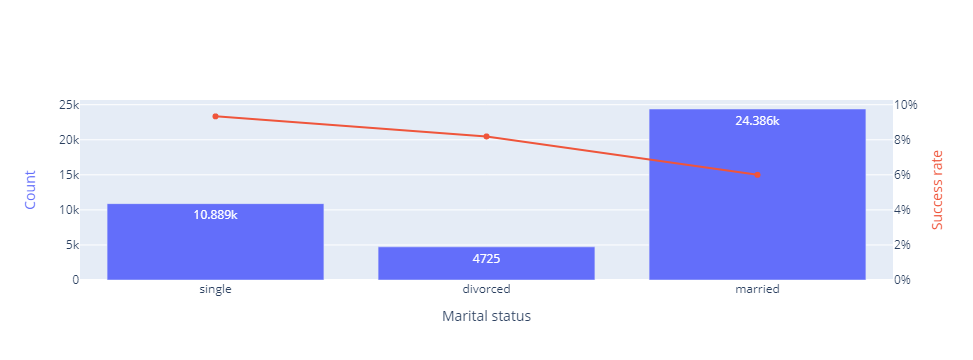

In [18]:
bar(df.marital, df.y, feature_name="Marital status", target_average_name="Success rate")

In [19]:
marital_order = df.groupby("marital").y.mean().sort_values(ascending=False).index

We see that the success rate among singles is the highest one, whereas it is the lowest one among married people. This might be because in marriages there is less opportunity to save money, and it is harder to arrive to an agreement with the partner about money.

We can try to see some relationship with the jobs these tree groups have

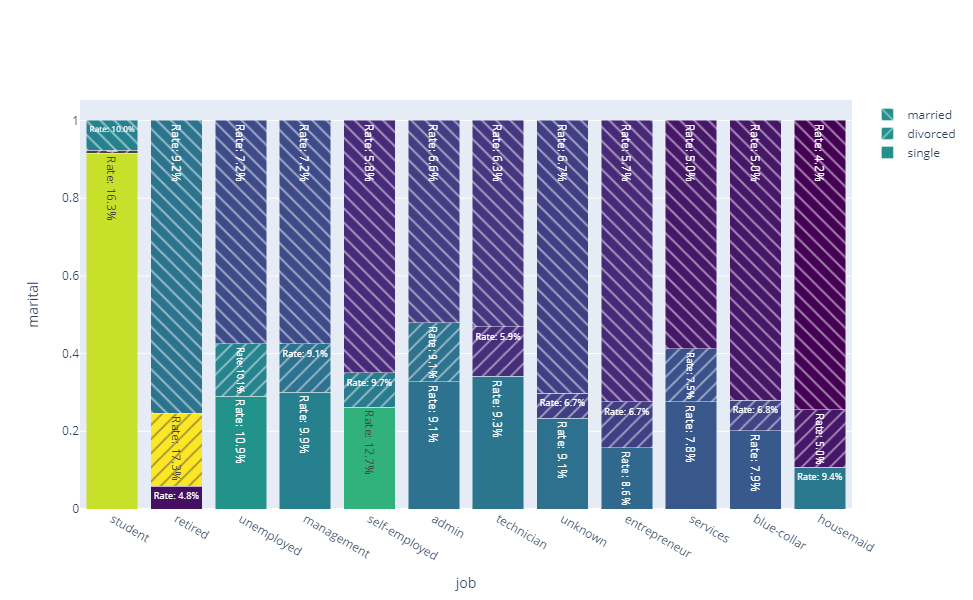

In [20]:
barchart_100_percent(df.job, df.marital, df.y)

Indeed we find that both the job and the marital state are relevant. We could have just found that only one of them matters, and that the other is conditionally independent with the target. But this is not the case. It seems both variables matter in order to predict the target.

## Education

In [21]:
df.education.unique()

array(['tertiary', 'secondary', 'unknown', 'primary'], dtype=object)

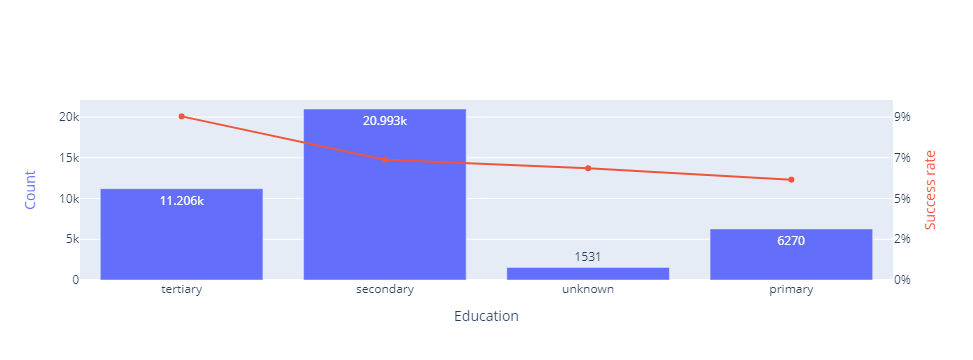

In [22]:
bar(df.education, df.y, feature_name="Education", target_average_name="Success rate")

We see that having tertiary education really improves the success rate of the deposits. It is probably due to the income level and to the job. We can take a look at the relationships of both variables:

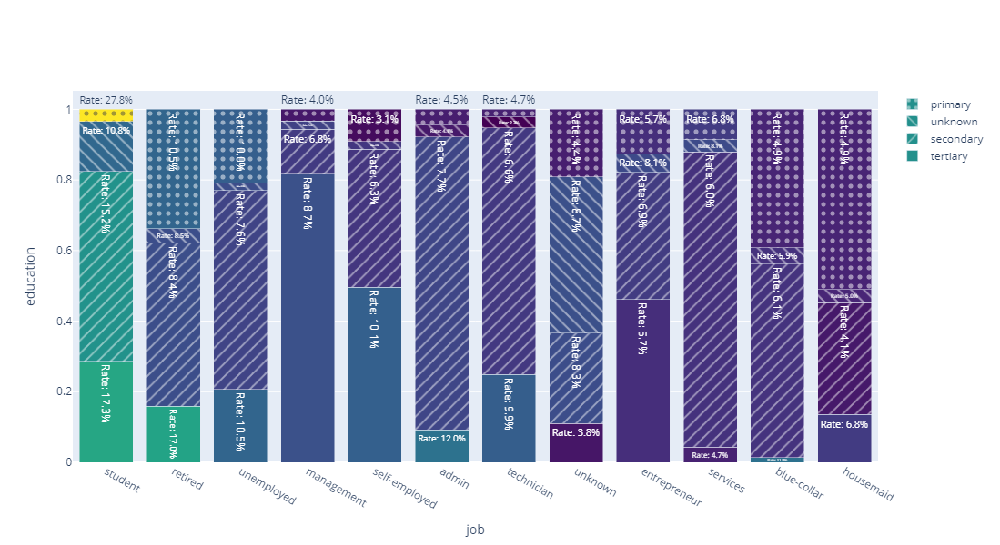

In [23]:
barchart_100_percent(df.job, df.education, df.y)

We see that indeed the deposits had more success among people with higher education level, but also that people with higher education level tend to also have jobs that themselves are better paid. Take a look at the top-right corner, with that big amount of people with only primary education that have jobs were deposits had lower success rate: blue-collar and housemaids.

Now let's take a look at the relationship with the marital status. We see that singles are generally the best educated.

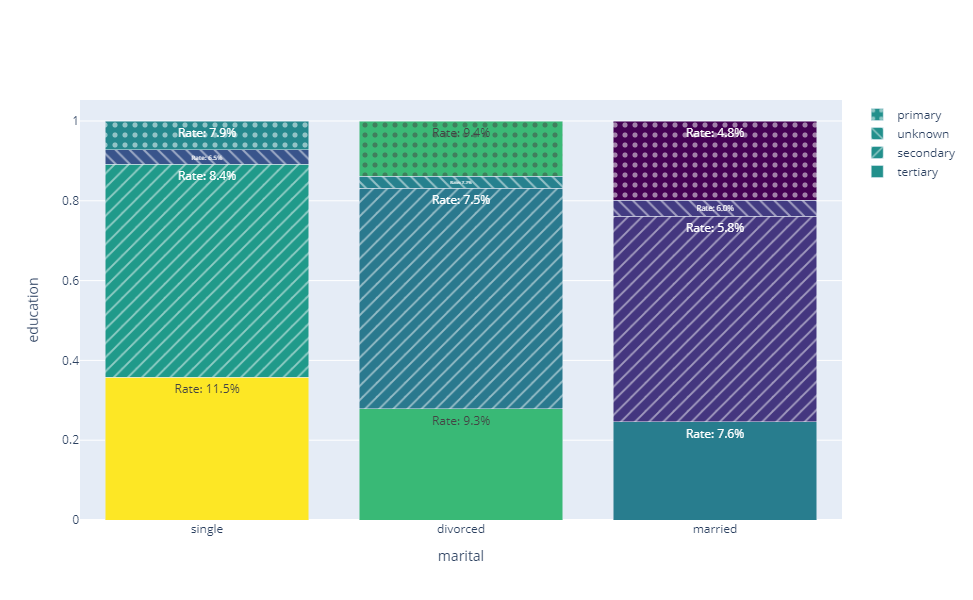

In [24]:
barchart_100_percent(df.marital, df.education, df.y)

## Default

In [25]:
df.default.unique()

array(['no', 'yes'], dtype=object)

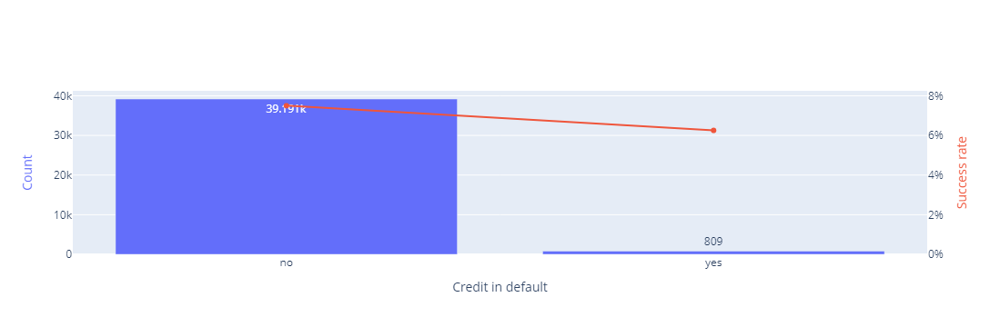

In [26]:
bar(df.default, df.y, feature_name="Credit in default", target_average_name="Success rate")

Of course having credit in default diminishes the probability of being interested in a term deposit.

The amount of people with default is so low compared to the size of the dataset that I don't think we should focus too much on it.

## Balance

This is a histogram where values lower or higher than 2 standard deviations from the mean have been clipped to those values:

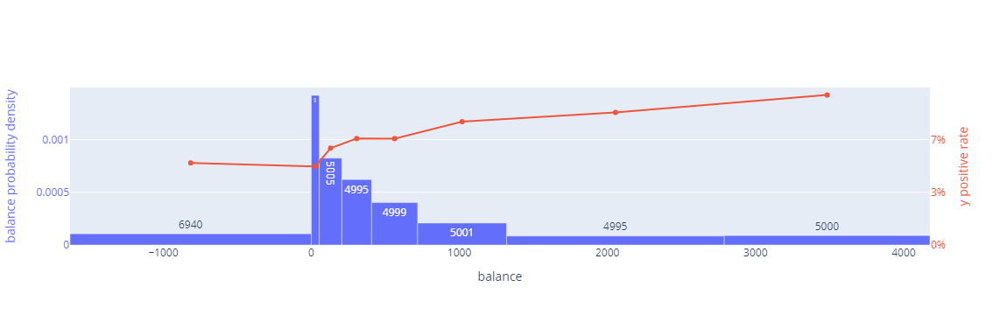

In [27]:
histogram(df, "balance", "y", clip_outliers_max_deviation=1, keep_group_size_constant=True)

We see that, for people with very small or negative balance, the success rate is just around 5%. However, when the balance increases, the probability of success also does.

Relating this to the job these people have, we see this:

In [28]:
def categorical_bar_chart_plus_violin(df, categorical_variable, violin_variable, category_order):
    def normalized_to_value(x: pd.Series, normalized_value):
        mu = x.mean()
        std = x.std()
        return normalized_value * std + mu
    
    
    categorical_frequency = df[categorical_variable].value_counts().reindex(category_order)
    
    return go.Figure(
        data=[
            go.Bar(
                x=categorical_frequency.index,
                y=categorical_frequency,
                name="Count",
                yaxis="y",
                showlegend=False,
            ),
            go.Violin(
                x=df[categorical_variable],
                y=df[violin_variable],
                width=1,
                fillcolor='lightseagreen',
                line_width=0,
                meanline = dict(color="black", width=2),
                points=False,
                showlegend=False,
                yaxis="y2",
            )
        ],
        layout=go.Layout(
            yaxis=dict(
                title="Count",
                titlefont=dict(
                    color=px.colors.qualitative.Plotly[0]
                ),
                side="left"
            ),
            yaxis2=dict(
                title=violin_variable,
                anchor="x",
                overlaying="y",
                side="right",
                titlefont_color="lightseagreen",
                tickmode="sync",
                range=[normalized_to_value(df[violin_variable], -2), normalized_to_value(df[violin_variable], 2)]
            ),
            height=500
        )
    )

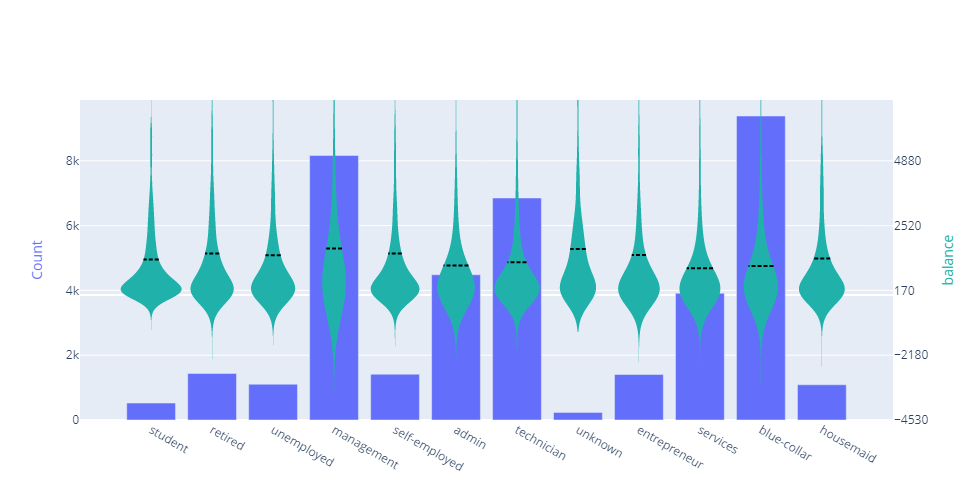

In [29]:
categorical_bar_chart_plus_violin(df, "job", "balance", df.groupby("job").y.mean().sort_values(ascending=False).index)

We are not seeing any particular difference. Maybe with a marimekko chart we see things more clearly:

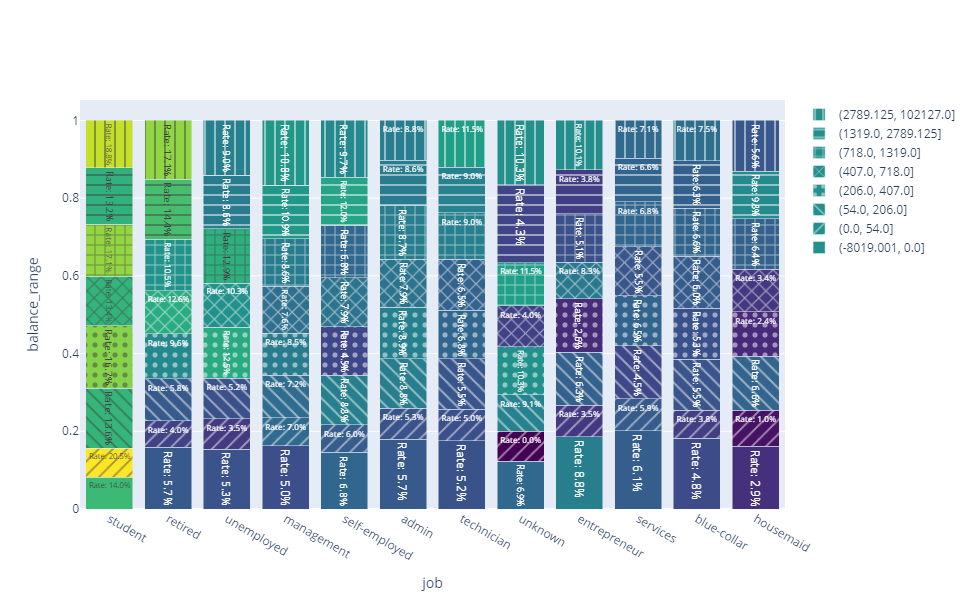

In [30]:
balance_range = pd.qcut(df.balance, q=8).map(str).rename("balance_range")
barchart_100_percent(df.job, balance_range, df.y)

## Housing

In [31]:
df.housing.value_counts()

yes    24031
no     15969
Name: housing, dtype: int64

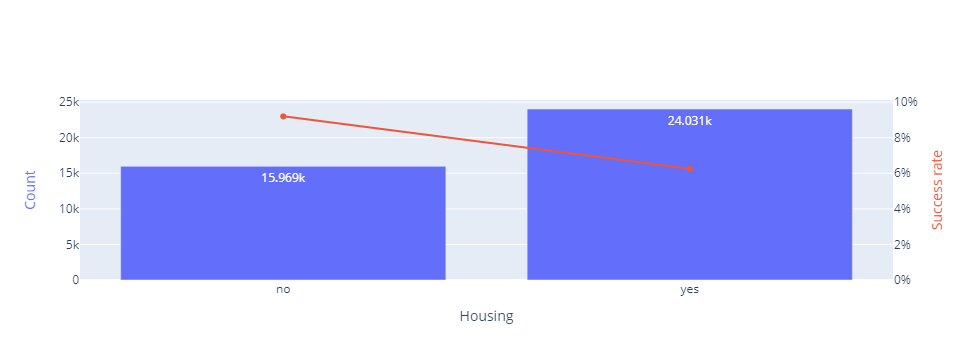

In [32]:
bar(df.housing, df.y, feature_name="Housing", target_average_name="Success rate")

This makes sense because people with a house are probably still paying the house, hence they need their money to be available.

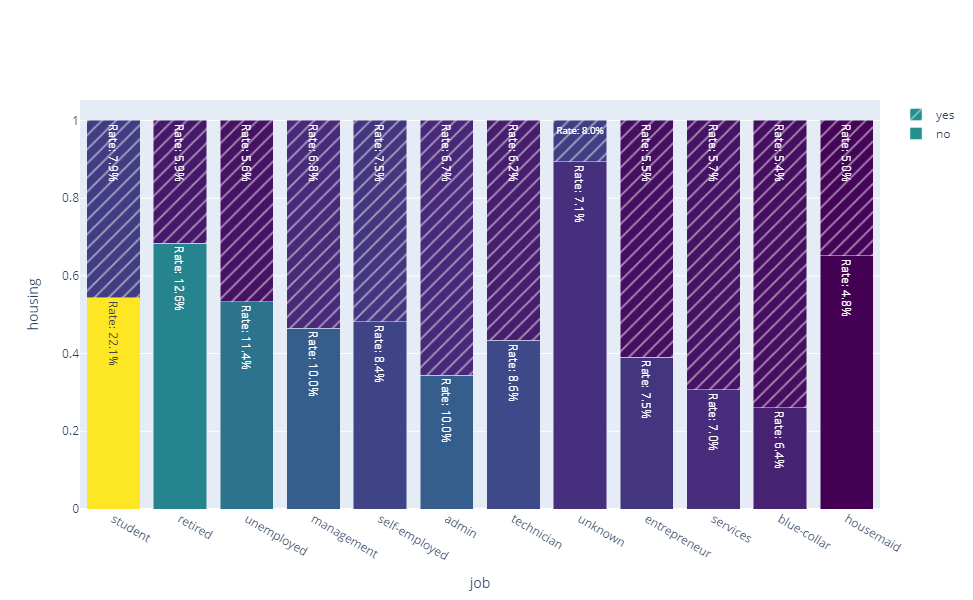

In [33]:
barchart_100_percent(df.job, df.housing, df.y)

## Loan

In [34]:
df.loan.value_counts()

no     33070
yes     6930
Name: loan, dtype: int64

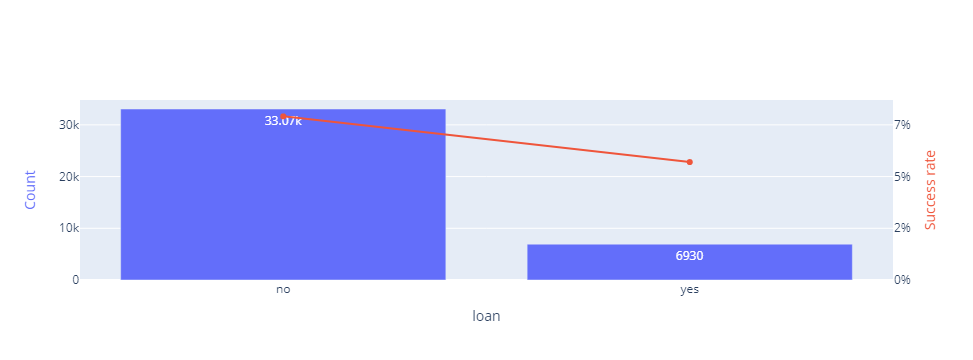

In [35]:
bar(df.loan, df.y, target_average_name="Success rate")

## Contact

In [36]:
df.contact.value_counts()

cellular     24914
unknown      12765
telephone     2321
Name: contact, dtype: int64

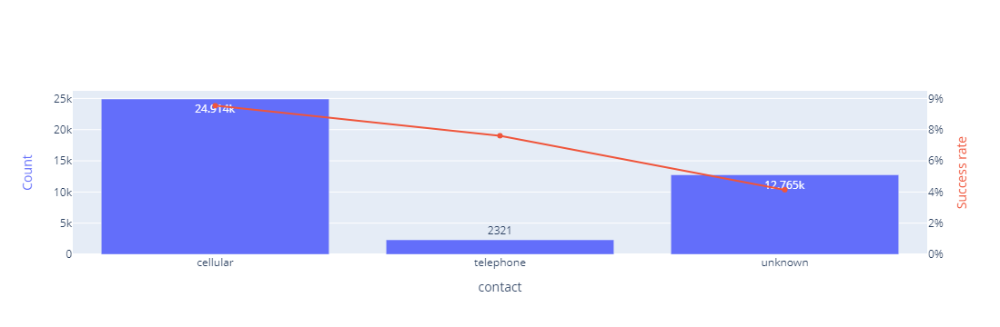

In [37]:
bar(df.contact, df.y, target_average_name="Success rate")

It seems contacting by cellular is the most effective way of doing it

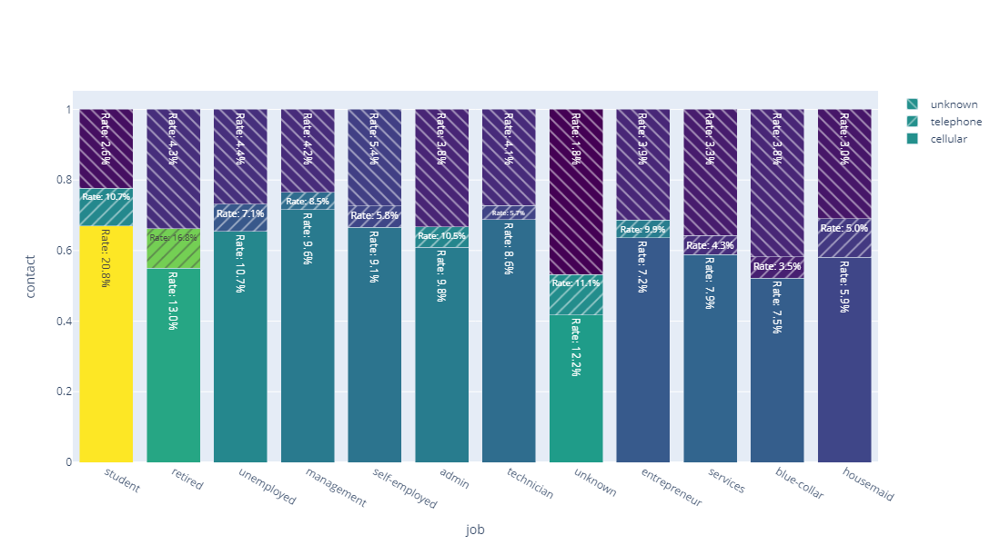

In [38]:
barchart_100_percent(df.job, df.contact, df.y)

## Day and month

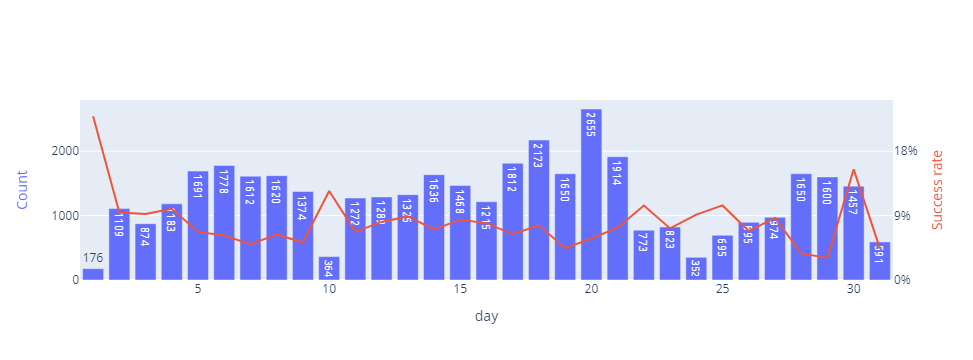

In [39]:
bar_numerical(df.day, df.y, target_average_name="Success rate")

With respect to the day of the month, we see there is an abnormally high success rate the first of the month, as well as the 30th.

In [40]:
month_index = df.month.replace(dict(
    jan=1,
    feb=2,
    mar=3,
    apr=4,
    may=5,
    jun=6,
    jul=7,
    aug=8,
    sep=9,
    oct=10,
    nov=11,
    dec=12
))

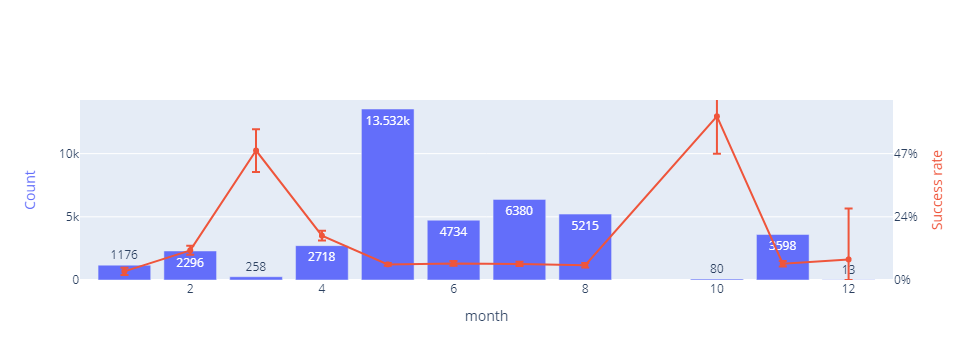

In [41]:
bar_numerical(month_index, df.y, target_average_name="Success rate", confidence_intervals_significance_level=0.01)

With respect to the month, we see abnormal peaks on march and october, but the number of samples is very small. What happened in these months that made them so high in success?

We can take a look at just the march and october data to see what is special about them:

In [42]:
def calculate_unexplained_partial_success_rate_increase(dist: ProbabilityDistribution, variable, given_variable, given_values):
    marg_prob = dist.get_marginal_probability(variable)
    marg_success_rate = dist.select_variables([variable, "y"]).conditioned_on(variable).given(y=True).distribution

    partial_dist = dist.given(**{given_variable: given_values})
    marg_prob_partial = partial_dist.get_marginal_probability(variable)
    marg_success_rate_partial = partial_dist.select_variables([variable, "y"]).conditioned_on(variable).given(y=True).distribution

    success_rate = dist.select_variables("y").get_marginal_probability("y").loc[True]
    expected_partial_success_rate = (marg_prob_partial * marg_success_rate).sum()
    partial_success_rate = partial_dist.select_variables("y").get_marginal_probability("y").loc[True]

    print(f"expected_partial_success_rate: {expected_partial_success_rate}")
    
    success_rate_expected_increase = expected_partial_success_rate - success_rate
    success_rate_unexplained_increase = partial_success_rate - expected_partial_success_rate
    unexplained_increase_proportion = success_rate_unexplained_increase / success_rate_expected_increase

    unexplained_increase_distribution = (marg_prob_partial * (marg_success_rate_partial - marg_success_rate)).transform(lambda s: s / s.sum())
    
    return unexplained_increase_proportion, unexplained_increase_distribution

In [43]:
dist = ProbabilityDistribution(df)
calculate_unexplained_partial_success_rate_increase(dist, "contact", "month", ["mar", "oct"])

expected_partial_success_rate: 0.08181802809644505


(45.97298573310383,
 contact
 cellular     0.659937
 telephone    0.230817
 unknown      0.109246
 dtype: float64)

Assuming that the data does not come from a leap year, we can group the days into 7 day intervals to see if there is any day of the week that is different from the rest:

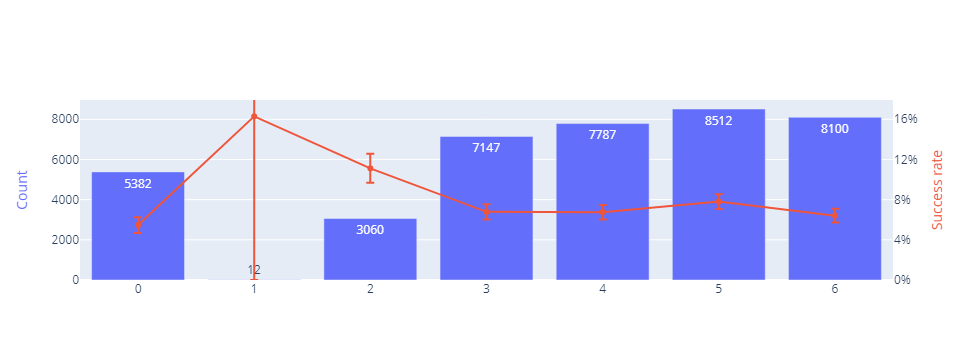

In [41]:
dates = pd.to_datetime(pd.concat([pd.Series(2022, index=df.index, name="year"), month_index, df.day], axis="columns"))
day_of_week = dates.dt.dayofweek
bar_numerical(day_of_week, df.y, target_average_name="Success rate", confidence_intervals_significance_level=0.01)

We do not see any signifcative difference any day of the week except for one day. The highest peak happened in a day with very few people contacted, so we are not going to take it into account. It was probably Sunday. However, it is strange the higher rate it happens on Mondays.

In [45]:
dist = ProbabilityDistribution(pd.concat([df, day_of_week.rename("day_of_week")], axis="columns"))
calculate_unexplained_partial_success_rate_increase(dist, "month", "day_of_week", 2)

expected_partial_success_rate: 0.10812579499399295


(0.15674095434480959,
 month
 apr   -3.191279
 aug         NaN
 dec         NaN
 feb   -1.405283
 jan         NaN
 jul         NaN
 jun    1.490767
 mar   -0.635937
 may    4.688401
 nov    0.043889
 oct    0.009441
 dtype: float64)

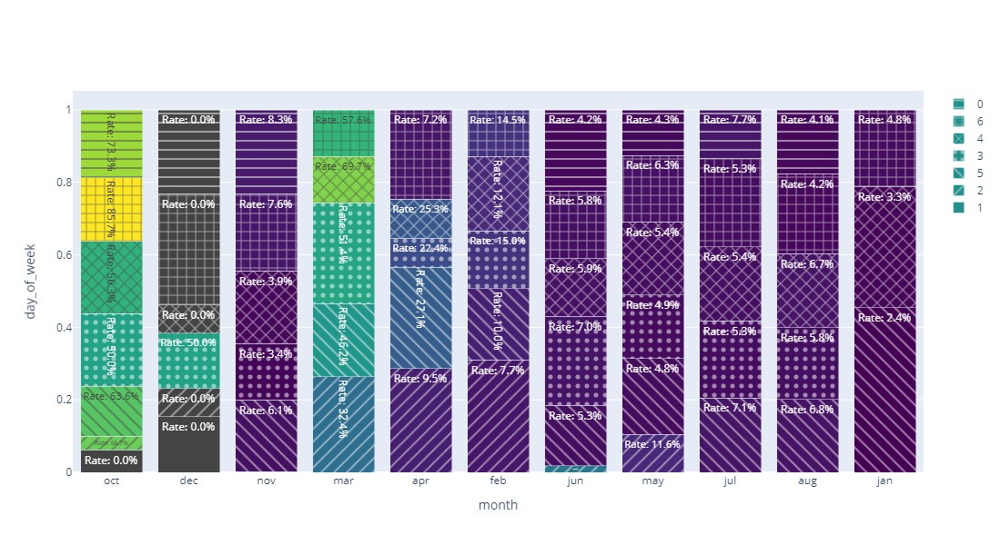

In [46]:
barchart_100_percent(df.month, day_of_week.rename("day_of_week"), df.y)

## Duration

In [47]:
pd.isnull(df.duration).any()

False

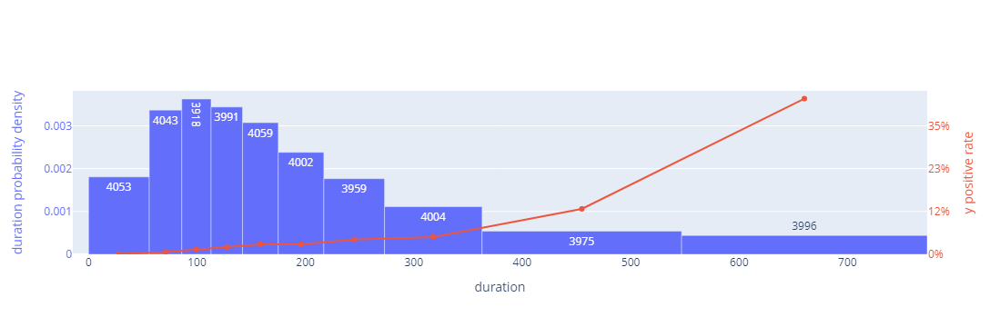

In [48]:
histogram(df, "duration", "y", number_of_bins=10, clip_outliers_max_deviation=2, keep_group_size_constant=True)

The higher the duration of the last contact, the more likey is the client to want the term deposit, which makes lots of sense.

## Campaign

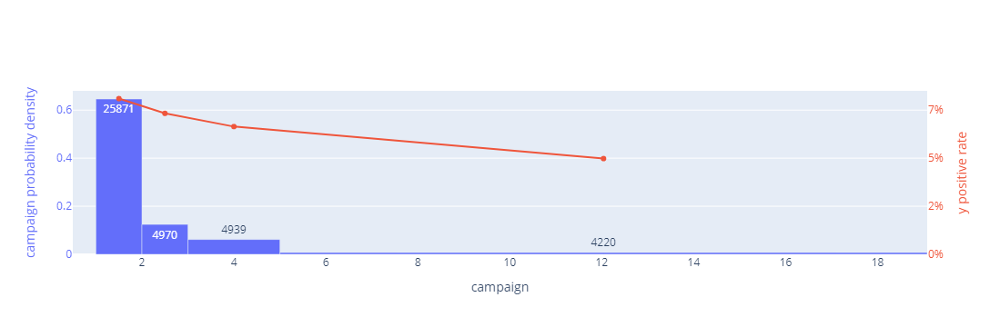

In [50]:
histogram(df, "campaign", "y", clip_outliers_max_deviation=5, number_of_bins=8, keep_group_size_constant=True)

This can be kind of counterintuitive. The more times the client is contacted, the lower the success rate. So, this graph suggests that we should not spend too much effort in contacting the same client again and again.

# Modeling

## Feature engineering
With the purpose of helping the classifier and to get more meaningful features, I am going to transform some features.

First of all, all continuous variables will be discretized into beans that make sense.

In [51]:
numerical_variables = df.dtypes == "int64"
df.columns[numerical_variables]

Index(['age', 'balance', 'day', 'duration', 'campaign'], dtype='object')

### Age

Let's take a look again at the chart for age

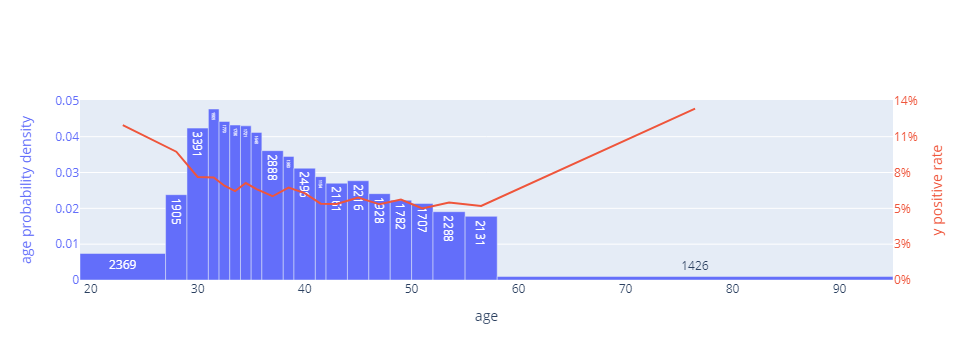

In [30]:
histogram(df, "age", "y", number_of_bins=20, keep_group_size_constant=True)

I think it makes sense to clearly distinguish a group for people under 25 and over 65. Then we can divide the rest in equal sized groups:

In [31]:
bins = [df.age.min(), 25, 35, 45, 55, 65, df.age.max()]
age_discretized = pd.cut(df.age, bins, include_lowest=True)

### Balance

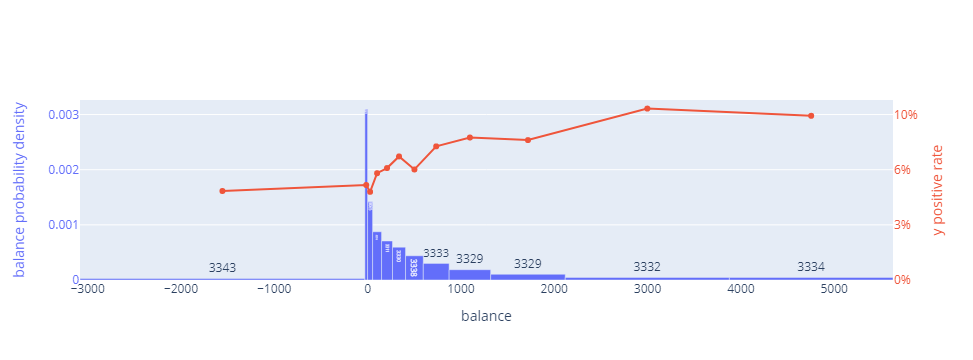

In [32]:
histogram(df, "balance", "y", number_of_bins=12, clip_outliers_max_deviation=1.5, keep_group_size_constant=True)

We cans see three main regions: the people that have less than 100 dollars, people that have over 2000, and the rest, whose success rate increases with money. Hence I propose a distribution like:

In [33]:
bins = [df.balance.min(), 100, 500, 1000, 2000, df.balance.max()]
balance_discretized = pd.cut(df.balance, bins, include_lowest=True)

### Duration of last call

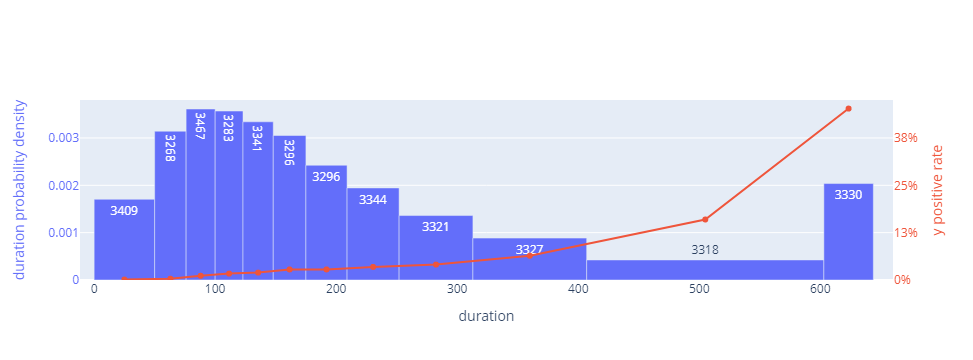

In [34]:
histogram(df, "duration", "y", number_of_bins=12, clip_outliers_max_deviation=1.5, keep_group_size_constant=True)

Here we see a continuous upward trend: the longer the call, the more likely it is to be successful. But, of course, this does not mean the causal relationship goes in that direction. It could be that, as the client is convinced, the call just tends to be longer.

The bins I will use are

In [35]:
bins = [df.duration.min(), 100, 200, 300, 400, 500, 600, df.duration.max()]
duration_discretized = pd.cut(df.duration, bins, include_lowest=True)

### Number of calls to client

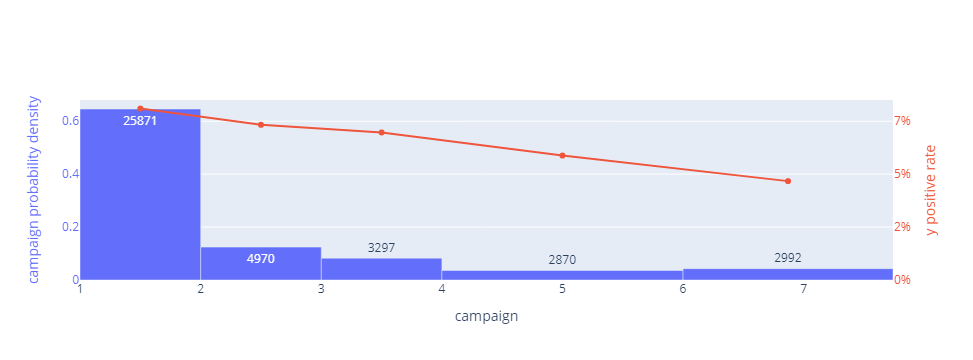

In [36]:
histogram(df, "campaign", "y", number_of_bins=12, clip_outliers_max_deviation=1.5, keep_group_size_constant=True)

Let's keep it simple here

In [37]:
bins = [1, 2, 4, 6, df.campaign.max()]
campaign_discretized = pd.cut(df.campaign, bins, include_lowest=True)

### Weekday

In [38]:
bar_numerical(day_of_week, df.y, target_average_name="Success rate", confidence_intervals_significance_level=0.01)

NameError: name 'day_of_week' is not defined

Here we will just apply a differentiation of whether it is Monday or not:

In [42]:
is_monday = day_of_week == 2

## Training

In [4]:
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score, fbeta_score, make_scorer, mutual_info_score, \
    ConfusionMatrixDisplay, precision_score, recall_score, roc_curve
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV, cross_val_score, cross_validate, \
    LeaveOneOut
from dataclasses import dataclass, make_dataclass, fields, asdict
from typing import Any, List
from collections import defaultdict

from model_evaluation import ModelEvaluationLaboratory
from model_training import optimize_hyperparameters

Prepare data

In [5]:
X = df.loc[:, df.columns != "y"]
y = df.y

In [6]:
X = pd.get_dummies(X, columns=X.columns[(X.dtypes == "object") | (X.dtypes == "int8")])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

Define evaluation metrics

In [7]:
def specificity_score(y_true: pd.Series, y_pred: pd.Series):
    true_negatives = sum((y_true == False) & (y_pred == False))
    false_positives = sum((y_true == False) & (y_pred == True))
    return true_negatives / (true_negatives + false_positives)


eval_lab = ModelEvaluationLaboratory(
    metrics=dict(
        Accuracy=accuracy_score,
        F1=f1_score,
        ROC_AUC=roc_auc_score,
        Precision=precision_score,
        Recall_Sensibility=recall_score,
        Specificity=specificity_score,
        beta_score=lambda y_test, y_pred: fbeta_score(y_test, y_pred, beta=2)
    )
)

Create classifier

In [8]:
xgb_model = xgb.XGBClassifier(objective="binary:logistic", random_state=0, n_estimators=1000, importance_type="total_gain")

In [9]:
xgb_model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None,
              importance_type='total_gain', interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=1000, n_jobs=None,
              num_parallel_tree=None, predictor=None, random_state=0, ...)

Pruebas

In [10]:
eval_lab.register_estimator("XGB over training", xgb_model)

In [22]:
# eval_lab.evaluate_estimator("XGB over training", X_train, y_train, X_test, y_test)

In [11]:
eval_lab.evaluate_estimator("XGB over training", X_test=X_test, y_test=y_test)

Optimize different parameters

In [82]:
# from scipy.stats import uniform, randint

# params = {
#     "colsample_bytree": uniform(0.7, 0.3),
#     "gamma": uniform(0, 0.5),
#     "learning_rate": uniform(0.03, 0.3),
#     "max_depth": randint(2, 6),
#     "subsample": uniform(0.6, 0.4)
# }

# xgb_optimized = optimize_hyperparameters(xgb_model, X_train, y_train, params, scoring=metrics["beta_score"], random=True, n_iter=10)


# Evaluation

In [12]:
eval_lab.get_estimator_scores_dataframe()

Training                                            \
                  Accuracy   F1 ROC_AUC Precision Recall_Sensibility   
Estimator                                                              
XGB over training      NaN  NaN     NaN       NaN                NaN   

                                         Cross-validation               ...  \
                  Specificity beta_score         Accuracy   F1 ROC_AUC  ...   
Estimator                                                               ...   
XGB over training         NaN        NaN              NaN  NaN     NaN  ...   

                                                                Test  \
                  Recall_Sensibility Specificity beta_score Accuracy   
Estimator                                                              
XGB over training                NaN         NaN        NaN   0.9375   

                                                                              \
                         F1 ROC_AUC Precision Recall_Sensibility Specificity   
Estimator                                                                      
XGB over training  0.502982  0.9343  0.587007               0.44    0.976027   

                              
                  beta_score  
Estimator                     
XGB over training     0.4632  

[1 rows x 21 columns]

In [175]:
def fbeta_score_from_confusion_matrix(TP, FP, FN, beta):
    recall = TP / (TP + FN)
    precision = TP / (TP + FP)
    return (1 + beta ** 2) * precision * recall / (beta**2 * precision + recall)


metrics, roc, confusion_matrix = eval_lab.plot_estimator_confusion_matrix_metrics(
    "XGB over training",
    X_test,
    y_test,
    dict(
        f2_score=lambda TP, FP, FN: fbeta_score_from_confusion_matrix(TP, FP, FN, beta=2),
        recall=lambda TP, FN: TP / (TP + FN),
        specificity=lambda TN, FP: TN / (TN + FP),
        precision=lambda TP, FP: TP / FP
    )
)

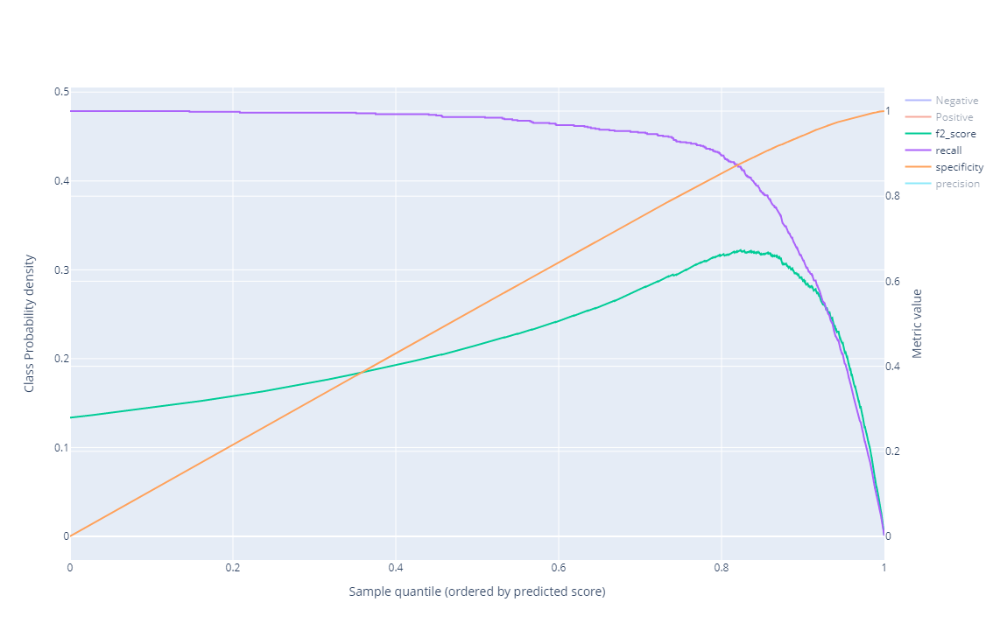

In [14]:
metrics

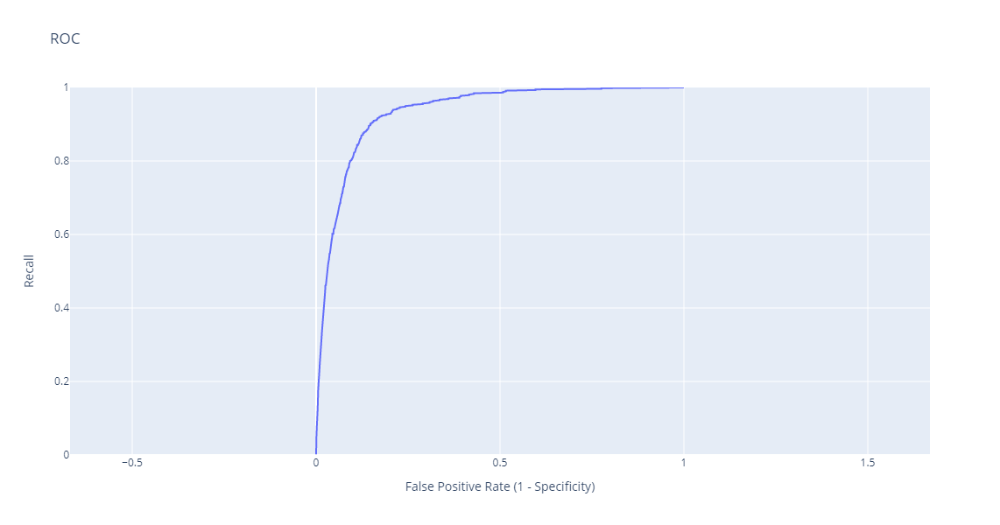

In [15]:
roc

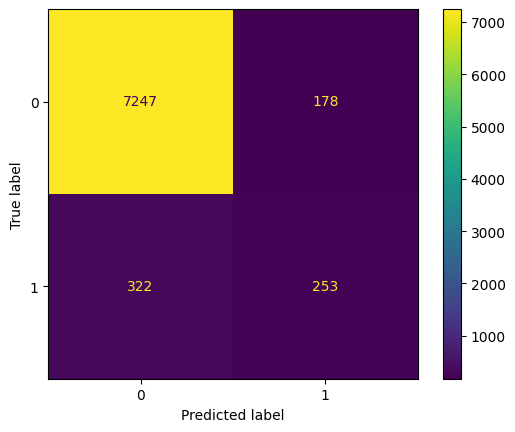

In [16]:
confusion_matrix.plot()

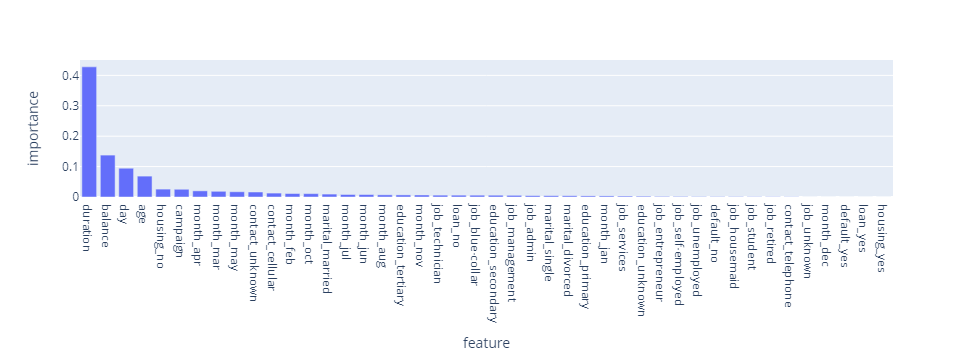

In [17]:
eval_lab.plot_feature_importances("XGB over training")

In [203]:
eval_lab.get_feature_importances("XGB over training")

feature
duration               0.428033
balance                0.137791
day                    0.094606
age                    0.068687
housing_no             0.025923
campaign               0.025417
month_apr              0.020226
month_mar              0.018759
month_may              0.017224
contact_unknown        0.016415
contact_cellular       0.012866
month_feb              0.011370
month_oct              0.011005
marital_married        0.009568
month_jul              0.008257
month_jun              0.008057
month_aug              0.007095
education_tertiary     0.006876
month_nov              0.006691
job_technician         0.006085
loan_no                0.006009
job_blue-collar        0.005965
education_secondary    0.005855
job_management         0.005449
job_admin              0.004533
marital_single         0.004325
marital_divorced       0.004147
education_primary      0.003650
month_jan              0.003585
job_services           0.003040
education_unknown      0.002590


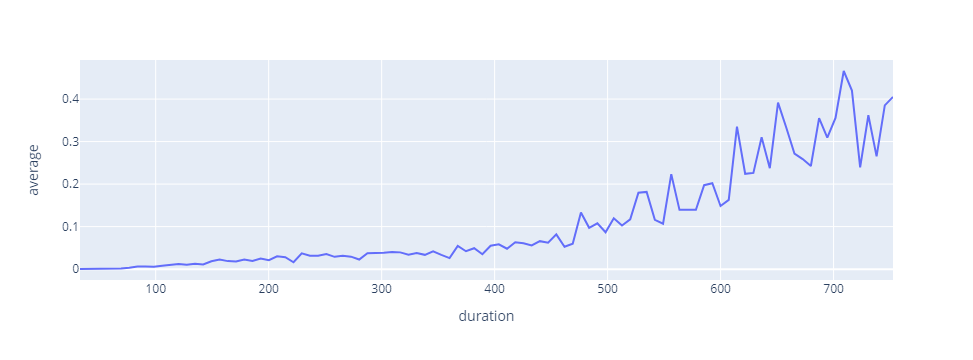

In [18]:
eval_lab.partial_dependence_plot("XGB over training", X_test, "duration")

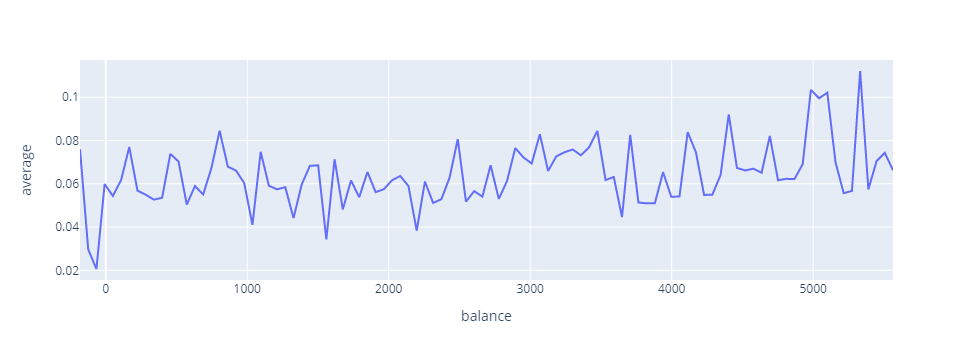

In [19]:
eval_lab.partial_dependence_plot("XGB over training", X_test, "balance")

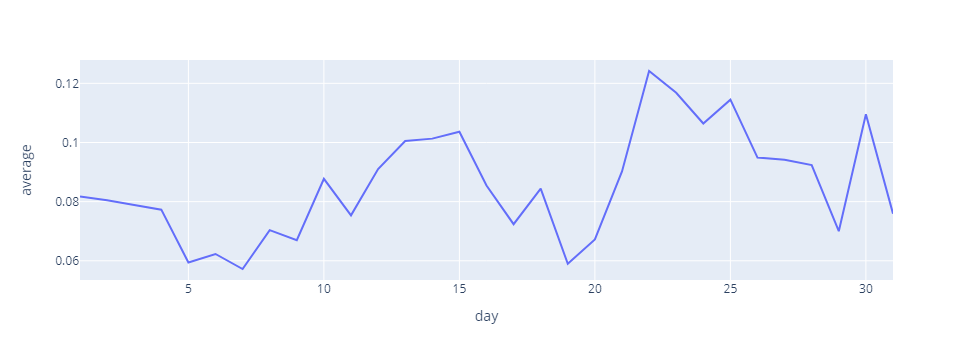

In [20]:
eval_lab.partial_dependence_plot("XGB over training", X_test, "day")

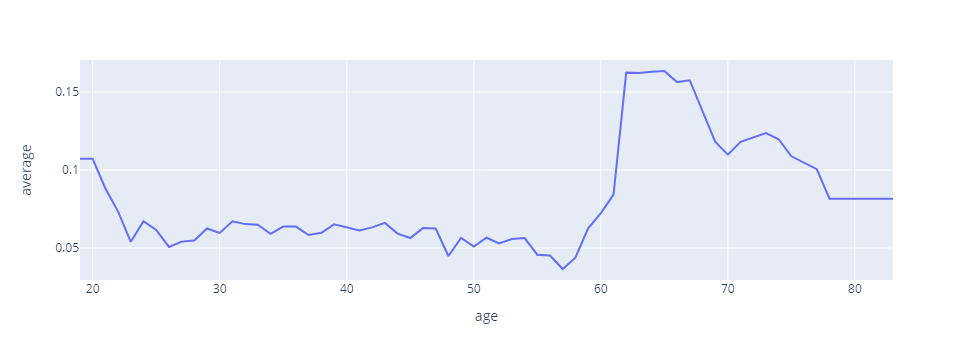

In [21]:
eval_lab.partial_dependence_plot("XGB over training", X_test, "age")

# Training with simplified features

Select only the 10 most importan features

In [134]:
feature_importances = eval_lab.get_feature_importances("XGB over training")
features = feature_importances.index[:10]
features

Index(['duration', 'balance', 'day', 'age', 'housing_no', 'campaign',
       'month_apr', 'month_mar', 'month_may', 'contact_unknown'],
      dtype='object', name='feature')

Off all these types, there are some numerical ones which I am going to discretize into meaningful bins.

In [135]:
bins = [df.age.min(), 25, 35, 45, 55, 65, df.age.max()]
age_discretized = pd.cut(X.age, bins, include_lowest=True)

In [136]:
bins = [df.balance.min(), 100, 500, 1000, 2000, df.balance.max()]
balance_discretized = pd.cut(X.balance, bins, include_lowest=True)

In [137]:
bins = [df.duration.min(), 100, 200, 300, 400, 500, 600, df.duration.max()]
duration_discretized = pd.cut(X.duration, bins, include_lowest=True)

In [138]:
bins = [1, 2, 4, 6, df.campaign.max()]
campaign_discretized = pd.cut(X.campaign, bins, include_lowest=True)

In [139]:
is_monday = (day_of_week.reindex_like(X) == 2).rename("is_monday")

In [152]:
X_most_important = pd.concat([
    duration_discretized.cat.codes.rename("duration"),
    balance_discretized.cat.codes.rename("balance"),
    X.day,
    is_monday,
    age_discretized.cat.codes.rename("age"),
    X.housing_no,
    campaign_discretized.cat.codes.rename("campaign"),
    X.month_apr,
    X.month_mar,
    X.month_may,
    X.contact_unknown
], axis="columns")

In [155]:
X_most_important_one_hot = pd.get_dummies(X_most_important, columns=["duration", "balance", "age", "campaign"])

In [165]:
X_most_important_one_hot_train = X_most_important_one_hot.reindex(X_train.index)
X_most_important_one_hot_test = X_most_important_one_hot.reindex(X_test.index)

In [181]:
X_most_important_train = X_most_important.reindex(X_train.index)
X_most_important_test = X_most_important.reindex(X_test.index)

In [182]:
xgb_model_2 = xgb.XGBClassifier(objective="binary:logistic", random_state=0, n_estimators=1000, importance_type="total_gain")

In [183]:
xgb_model_2.fit(X_most_important_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None,
              importance_type='total_gain', interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=1000, n_jobs=None,
              num_parallel_tree=None, predictor=None, random_state=0, ...)

In [184]:
eval_lab.register_estimator("XGB_most_important", xgb_model_2)

In [185]:
eval_lab.evaluate_estimator("XGB_most_important", X_test=X_most_important_test, y_test=y_test)

In [186]:
eval_lab.get_estimator_scores_dataframe()

Training                                            \
                   Accuracy   F1 ROC_AUC Precision Recall_Sensibility   
Estimator                                                               
XGB over training       NaN  NaN     NaN       NaN                NaN   
XGB_most_important      NaN  NaN     NaN       NaN                NaN   

                                          Cross-validation               ...  \
                   Specificity beta_score         Accuracy   F1 ROC_AUC  ...   
Estimator                                                                ...   
XGB over training          NaN        NaN              NaN  NaN     NaN  ...   
XGB_most_important         NaN        NaN              NaN  NaN     NaN  ...   

                                                                 Test  \
                   Recall_Sensibility Specificity beta_score Accuracy   
Estimator                                                               
XGB over training                 NaN         NaN        NaN   0.9375   
XGB_most_important                NaN         NaN        NaN  0.92375   

                                                                     \
                          F1   ROC_AUC Precision Recall_Sensibility   
Estimator                                                             
XGB over training   0.502982    0.9343  0.587007               0.44   
XGB_most_important  0.429907  0.918663  0.464646                0.4   

                                           
                   Specificity beta_score  
Estimator                                  
XGB over training     0.976027     0.4632  
XGB_most_important     0.96431   0.411449  

[2 rows x 21 columns]

In [190]:
def fbeta_score_from_confusion_matrix(TP, FP, FN, beta):
    recall = TP / (TP + FN)
    precision = TP / (TP + FP)
    return (1 + beta ** 2) * precision * recall / (beta**2 * precision + recall)


metrics_most_important, roc_most_important, confusion_matrix_most_important = eval_lab.plot_estimator_confusion_matrix_metrics(
    "XGB_most_important",
    X_most_important_test,
    y_test,
    dict(
        f2_score=lambda TP, FP, FN: fbeta_score_from_confusion_matrix(TP, FP, FN, beta=2),
        recall=lambda TP, FN: TP / (TP + FN),
        specificity=lambda TN, FP: TN / (TN + FP),
        precision=lambda TP, FP: TP / FP
    )
)

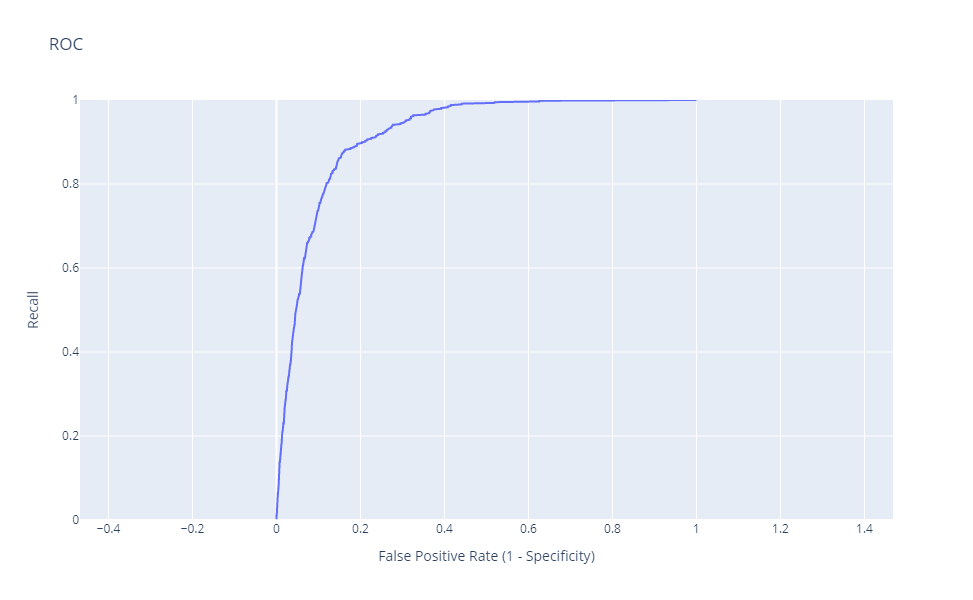

In [191]:
roc_most_important

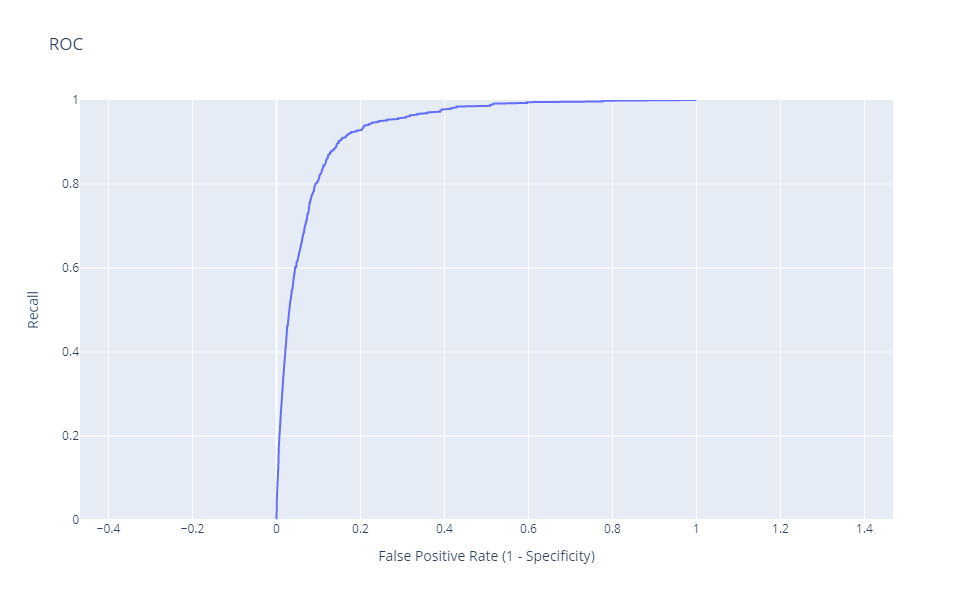

In [178]:
roc

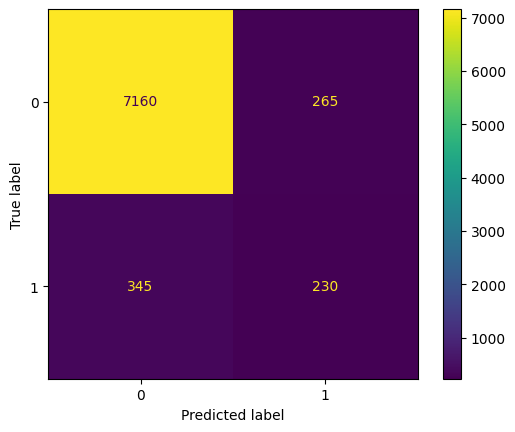

In [193]:
confusion_matrix_most_important.plot()

In [194]:
def bar_true_target_vs_predicted(
        categorical_feature: pd.Series,
        binary_target: pd.Series,
        predicted_target: pd.Series,
        feature_name: str = None,
        feature_count_name="Count",
        target_average_name="Target average"
):
    df = pd.concat([categorical_feature, binary_target, predicted_target], axis="columns", ignore_index=True).set_axis(
        ("feature", "label", "predicted"), axis="columns")
    df_grouped = df.groupby("feature").aggregate(
        freq=pd.NamedAgg("label", "count"),
        avg=pd.NamedAgg("label", "mean"),
        avg_predicted=pd.NamedAgg("predicted", "mean")
    ).sort_values("avg", ascending=False)

    return go.Figure(
        data=[
            go.Bar(
                x=df_grouped.index,
                y=df_grouped.freq,
                texttemplate="%{y}",
                showlegend=False,
                yaxis="y"
            ),
            go.Scatter(
                x=df_grouped.index,
                y=df_grouped.avg,
                showlegend=False,
                yaxis="y2"
            ),
            go.Scatter(
                x=df_grouped.index,
                y=df_grouped.avg_predicted,
                showlegend=False,
                yaxis="y2"
            )
        ],
        layout=go.Layout(
            xaxis_title=feature_name or categorical_feature.name,
            yaxis=dict(
                title=feature_count_name,
                titlefont_color=px.colors.qualitative.Plotly[0],
                side="left"
            ),
            yaxis2=dict(
                title=target_average_name,
                anchor="x",
                overlaying="y",
                side="right",
                titlefont_color=px.colors.qualitative.Plotly[1],
                tickmode="sync",
                tickformat='.0%',
                range=[0, df_grouped.avg.max() * 1.1]
            ),
        )
    )


In [195]:
X_most_important_test

,duration,balance,day,is_monday,age,housing_no,campaign,month_apr,month_mar,month_may,contact_unknown
12836,1,0,7,False,1,0,0,0,0,0,0
10913,3,3,17,False,2,1,0,0,0,0,1
4214,1,4,19,False,2,0,1,0,0,1,1
8198,1,3,2,False,1,0,3,0,0,0,1
31403,1,4,26,False,2,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...
38220,0,1,15,False,3,0,0,0,0,1,0
7416,0,0,29,False,3,0,0,0,0,1,1
8455,6,4,3,False,2,0,0,0,0,0,1
325,1,1,5,False,3,1,1,0,0,1,1


In [197]:
y_predicted = xgb_model_2.predict(X_most_important_test)

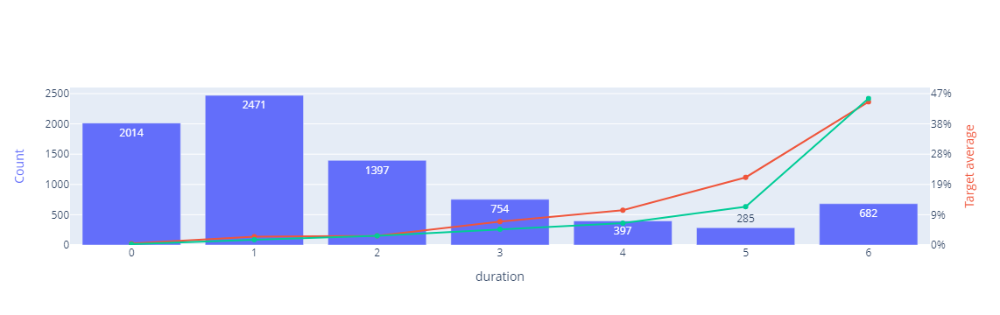

In [202]:
bar_true_target_vs_predicted(X_most_important_test.duration, y_test, pd.Series(y_predicted, index=y_test.index))